#  1. Imports & Spark Setup

In [0]:
%pip install holidays

Python interpreter will be restarted.
Python interpreter will be restarted.


In [0]:
# %%
import os
import pandas as pd
import matplotlib.pyplot as plt
import holidays

# PySpark
import pyspark
from pyspark.sql import SparkSession, Window
import pyspark.sql.functions as F
from pyspark.sql.functions import (
    col, date_trunc, hour, dayofweek, dayofmonth, month,
    count, to_timestamp, year, lit, expr, sequence, explode,
    when, isnan,isnull,  mean, percentile_approx
)
from pyspark.sql.types import IntegerType

#from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error


from pyspark.ml import Pipeline
from pyspark.ml.feature import Imputer, VectorAssembler
from pyspark.ml.regression import RandomForestRegressor, GBTRegressor, LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

# 2. Load & Feature-Engineer Taxi Data

In [0]:
df = spark.read.parquet("/dbfs/FileStore/clean/dataset_after_cleaning.parquet")
display(df)

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee,month,year,is_weekend,is_holiday,pickup_hour_decimal,trip_duration_minutes,trip_speed_mph,is_shared_ride,has_toll,PU_DO_pair,has_congestion_fee
2,2024-10-08T08:53:13.000+0000,2024-10-08T09:25:29.000+0000,1.0,2.06,1.0,68,163,1,26.8,0.0,0.5,7.7,0.0,1.0,38.5,2.5,0,10,2024,0,0,8.883333333333333,32.266666666666666,3.830578512396694,0,0,68-163,1
2,2024-10-12T15:13:25.000+0000,2024-10-12T15:24:29.000+0000,1.0,1.2,1.0,163,233,1,11.4,0.0,0.5,3.08,0.0,1.0,18.48,2.5,0,10,2024,1,0,15.216666666666667,11.066666666666666,6.506024096385542,0,0,163-233,1
2,2024-10-30T11:52:03.000+0000,2024-10-30T12:06:10.000+0000,1.0,1.49,1.0,230,90,1,13.5,0.0,0.5,3.5,0.0,1.0,21.0,2.5,0,10,2024,0,0,11.866666666666667,14.116666666666667,6.332939787485242,0,0,230-90,1
2,2024-10-10T14:34:00.000+0000,2024-10-10T14:58:41.000+0000,1.0,2.18,1.0,236,161,1,21.9,0.0,0.5,5.18,0.0,1.0,31.08,2.5,0,10,2024,0,0,14.566666666666666,24.683333333333334,5.299122214719784,0,0,236-161,1
2,2024-10-29T09:40:17.000+0000,2024-10-29T10:19:25.000+0000,1.0,8.51,1.0,138,166,1,39.4,5.0,0.5,5.5,6.94,1.0,60.09,0.0,1,10,2024,0,0,9.666666666666666,39.13333333333333,13.04770017035775,0,1,138-166,0
2,2024-10-21T21:34:28.000+0000,2024-10-21T21:51:48.000+0000,1.0,2.55,1.0,237,100,1,17.7,1.0,0.5,4.54,0.0,1.0,27.24,2.5,0,10,2024,0,0,21.566666666666666,17.333333333333332,8.826923076923077,0,0,237-100,1
2,2024-10-21T06:57:21.000+0000,2024-10-21T07:59:24.000+0000,2.0,17.41,2.0,132,100,1,70.0,0.0,0.5,16.19,6.94,1.0,98.88,2.5,1,10,2024,0,0,6.95,62.05,16.834810636583402,1,1,132-100,1
2,2024-10-01T11:46:53.000+0000,2024-10-01T11:57:08.000+0000,1.0,1.81,1.0,239,166,1,11.4,0.0,0.5,3.08,0.0,1.0,18.48,2.5,0,10,2024,0,0,11.766666666666667,10.25,10.595121951219513,0,0,239-166,1
2,2024-10-19T22:38:58.000+0000,2024-10-19T23:09:45.000+0000,6.0,3.27,1.0,114,230,1,26.8,1.0,0.5,6.36,0.0,1.0,38.16,2.5,0,10,2024,1,0,22.633333333333333,30.783333333333335,6.373578776394152,1,0,114-230,1
2,2024-10-12T20:39:04.000+0000,2024-10-12T20:57:21.000+0000,1.0,3.05,1.0,262,170,1,19.1,1.0,0.5,4.82,0.0,1.0,28.92,2.5,0,10,2024,1,0,20.65,18.283333333333335,10.009115770282587,0,0,262-170,1


### Feature Engineering: Temporal Feature Extraction

We now extract new temporal features from the `tpep_pickup_datetime` column, such as hour of the day, day of the week, day of the month, and month. These features help capture seasonal and behavioral patterns in the trips. We also create a binary variable `is_weekend` to indicate whether the trip occurred on a weekend.


In [0]:
# Truncate to hour & extract calendar features
df = (
    df
    .withColumn("pickup_binned", date_trunc("hour", col("tpep_pickup_datetime")))
    .withColumn("hour", hour(col("pickup_binned")))
    .withColumn("day_of_week", dayofweek(col("pickup_binned")))
    .withColumn("day_of_month", dayofmonth(col("pickup_binned")))
    .withColumn("month", month(col("pickup_binned")))
    .withColumn("is_weekend", (col("day_of_week").isin([1,7])).cast(IntegerType()))
)


# 3. Aggregate & Enrich with Weather & Holidays

In [0]:
# Hourly taxi counts
df_counts = df.groupBy("pickup_binned").agg(count("*").alias("order_count"))

In [0]:
# One row per hour for the time features
df_timefeat = (
    df.select("pickup_binned", "hour", "day_of_week", "day_of_month", "month", "is_weekend")
      .dropDuplicates(["pickup_binned"])
)

In [0]:
# Join counts + time features → ~26K rows
df_small = df_counts.join(df_timefeat, on="pickup_binned", how="left")


In [0]:
# Load hourly weather CSV & parse timestamp
weather_path = "/FileStore/tables/new_york_2022_01_01_to_2024_12_31.csv"
df_weather = (
    spark.read.option("header", True).csv(weather_path)
    .withColumn("pickup_binned", to_timestamp(col("datetime"), "yyyy-MM-dd'T'HH:mm:ss"))
    .select("pickup_binned", "temp", "feelslike", "dew", "humidity", "precip", "precipprob", "snow")
)


In [0]:
numeric_columns = ["temp", "feelslike", "dew", "humidity", "precip", "precipprob", "snow"]

# Count NaN only
nan_counts = df_weather.select([
    count(when(isnan(col(c)), c)).alias(c)
    for c in numeric_columns
])

# Show results
nan_counts.show()


+----+---------+---+--------+------+----------+----+
|temp|feelslike|dew|humidity|precip|precipprob|snow|
+----+---------+---+--------+------+----------+----+
|   0|        0|  0|       0|     0|         0|   0|
+----+---------+---+--------+------+----------+----+



In [0]:
# Merge weather → still ~26K rows
df_enriched = df_small.join(df_weather, on="pickup_binned", how="left")

In [0]:
print(df_enriched.columns)


['pickup_binned', 'order_count', 'hour', 'day_of_week', 'day_of_month', 'month', 'is_weekend', 'temp', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'snow']


In [0]:

# Add holiday flag via UDF on small table
us_h = holidays.US(years=[2022,2023,2024])
@F.udf(IntegerType())
def is_hol(dt):
    return 0 if dt is None else int(dt.date() in us_h)

df_enriched = df_enriched.withColumn("is_holiday", is_hol(col("pickup_binned")))

In [0]:

# Filter only years 2022–2024
df_enriched = df_enriched.filter(year(col("pickup_binned")).isin(2022,2023,2024))

# 4. Fill Missing Hours & Rebuild Time-Features

To ensure that our time series includes all hourly timestamps, even when no trips occurred, we first compute the minimum and maximum pickup timestamps. Then, we generate a complete sequence of hourly intervals between these bounds. Finally, we perform a left join with the enriched dataset and fill any missing `order_count` values with 0. This guarantees a continuous time series with no missing hours.


In [0]:
# 4.1 Compute min/max and build a full-hour index
bounds = df_enriched.agg(
    F.min("pickup_binned").alias("start"),
    F.max("pickup_binned").alias("end")
).collect()[0]
start, end = bounds["start"], bounds["end"]

In [0]:
df_hours = (
    spark.range(1)
    .select(sequence(lit(start), lit(end), expr("interval 1 hour")).alias("all_hours"))
    .select(explode("all_hours").alias("pickup_binned"))
)


In [0]:
# Left-join and refill order_count=0
df_full = df_hours.join(df_enriched, on="pickup_binned", how="left") \
    .fillna({"order_count": 0})

In [0]:
# Recompute time features for any newly inserted hours
df_full = (
    df_full
    .withColumn("hour", hour(col("pickup_binned")))
    .withColumn("day_of_week", dayofweek(col("pickup_binned")))
    .withColumn("day_of_month", dayofmonth(col("pickup_binned")))
    .withColumn("month", month(col("pickup_binned")))
    .withColumn("is_weekend", (col("day_of_week").isin([1,7])).cast(IntegerType()))
)


In [0]:
df_full.printSchema()

root
 |-- pickup_binned: timestamp (nullable = false)
 |-- order_count: long (nullable = false)
 |-- hour: integer (nullable = false)
 |-- day_of_week: integer (nullable = false)
 |-- day_of_month: integer (nullable = false)
 |-- month: integer (nullable = false)
 |-- is_weekend: integer (nullable = false)
 |-- temp: string (nullable = true)
 |-- feelslike: string (nullable = true)
 |-- dew: string (nullable = true)
 |-- humidity: string (nullable = true)
 |-- precip: string (nullable = true)
 |-- precipprob: string (nullable = true)
 |-- snow: string (nullable = true)
 |-- is_holiday: integer (nullable = true)



In [0]:
df_full.display()

pickup_binned,order_count,hour,day_of_week,day_of_month,month,is_weekend,temp,feelslike,dew,humidity,precip,precipprob,snow,is_holiday
2022-01-02T13:00:00.000+0000,3487,13,1,2,1,1,14,14,11.2,83.47,0,0,0,0
2022-01-03T00:00:00.000+0000,699,0,2,3,1,0,3.1,-0.5,-3,64.28,0,0,0,0
2022-01-05T06:00:00.000+0000,1096,6,4,5,1,0,0.7,-1.6,-2.6,78.12,0.3,100,0,0
2022-01-21T05:00:00.000+0000,452,5,6,21,1,0,-9.2,-16.9,-17.9,49.44,0,0,0,0
2022-01-21T20:00:00.000+0000,4415,20,6,21,1,0,-6.7,-12.2,-18.6,38.43,0,0,0,0
2022-01-22T14:00:00.000+0000,5208,14,7,22,1,1,-1.8,-4.7,-11.8,46.34,0,0,0,0
2022-01-29T08:00:00.000+0000,301,8,7,29,1,1,-8.4,-16.8,-10.7,83.95,1.084,100,0.46,0
2022-02-02T09:00:00.000+0000,3914,9,4,2,2,0,2.7,0.3,0.2,83.52,0,0,0,0
2022-02-04T18:00:00.000+0000,7343,18,6,4,2,0,-1,-5.2,-2.6,88.34,0.5,100,0,0
2022-02-13T22:00:00.000+0000,4349,22,1,13,2,1,-3,-8.6,-10.3,57.07,0,0,0,0


In [0]:
# List of columns to cast to float
string_columns_to_float = ["temp", "feelslike", "dew", "humidity", "precip", "precipprob", "snow"]

# Apply casting
df_full_casted = df_full
for c in string_columns_to_float:
    df_full_casted = df_full_casted.withColumn(c, col(c).cast("float"))



In [0]:
df_full_casted.printSchema()

root
 |-- pickup_binned: timestamp (nullable = false)
 |-- order_count: long (nullable = false)
 |-- hour: integer (nullable = false)
 |-- day_of_week: integer (nullable = false)
 |-- day_of_month: integer (nullable = false)
 |-- month: integer (nullable = false)
 |-- is_weekend: integer (nullable = false)
 |-- temp: float (nullable = true)
 |-- feelslike: float (nullable = true)
 |-- dew: float (nullable = true)
 |-- humidity: float (nullable = true)
 |-- precip: float (nullable = true)
 |-- precipprob: float (nullable = true)
 |-- snow: float (nullable = true)
 |-- is_holiday: integer (nullable = true)



In [0]:
numeric_columns = [c for c, dtype in df_full_casted.dtypes 
                   if c != 'pickup_binned' and dtype in ['float', 'double', 'int', 'integer', 'long']]

# Build NaN-only checks
nan_counts = df_full_casted.select([
    count(when(isnan(col(c)), c)).alias(c) 
    for c in numeric_columns
])
nan_counts.show(truncate=False)



+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+
|hour|day_of_week|day_of_month|month|is_weekend|temp|feelslike|dew|humidity|precip|precipprob|snow|is_holiday|
+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+
|0   |0          |0           |0    |0         |0   |0        |0  |0       |0     |0         |0   |0         |
+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+



In [0]:
df_full_casted.write.mode("overwrite").parquet("/dbfs/FileStore/tables/model/df_full_casted.parquet")

# 5. Supervised Time Series Forecasting Using Lag-Based Regression Models

We approached the forecasting problem using a supervised regression framework. By transforming the time series into a feature-rich tabular dataset through the use of lag variables and rolling statistics, we enabled the application of Spark MLlib regression models (Random Forest, Gradient Boosted Trees, and Linear Regression). This method leverages temporal patterns while taking advantage of the scalability and flexibility of Spark’s distributed machine learning capabilities.

## 5.1 Add Lag & Rolling-Window Features

To capture temporal dependencies in the target variable (`order_count`), we add lag features and rolling-window statistics. Lag features provide the model with past values of the target, while rolling features summarize recent trends, such as the average or variability over the last few hours. These features are essential for transforming the time series into a supervised learning format suitable for machine learning models.


In [0]:
w = Window.orderBy("pickup_binned")
w24  = w.rowsBetween(-24, -1)
w168 = w.rowsBetween(-168, -1)

In [0]:
df_feat = (
    df_full_casted
    .withColumn("lag_1h",  F.lag("order_count", 1).over(w))
    .withColumn("lag_24h", F.lag("order_count", 24).over(w))
    .withColumn("roll24_mean", F.avg("order_count").over(w24))
    .withColumn("roll168_mean",F.avg("order_count").over(w168))
    .withColumn("roll24_std", F.stddev("order_count").over(w24))
)


In [0]:
df_feat

Out[24]: DataFrame[pickup_binned: timestamp, order_count: bigint, hour: int, day_of_week: int, day_of_month: int, month: int, is_weekend: int, temp: float, feelslike: float, dew: float, humidity: float, precip: float, precipprob: float, snow: float, is_holiday: int, lag_1h: bigint, lag_24h: bigint, roll24_mean: double, roll168_mean: double, roll24_std: double]

In [0]:
df_feat.select([
    count(when(isnull(col(c)), c)).alias(c)
    for c in df_feat.columns
]).show()

+-------------+-----------+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+------+-------+-----------+------------+----------+
|pickup_binned|order_count|hour|day_of_week|day_of_month|month|is_weekend|temp|feelslike|dew|humidity|precip|precipprob|snow|is_holiday|lag_1h|lag_24h|roll24_mean|roll168_mean|roll24_std|
+-------------+-----------+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+------+-------+-----------+------------+----------+
|            0|          0|   0|          0|           0|    0|         0|  62|       62| 62|      62|    62|        62|  62|        62|     1|     24|          1|           1|         2|
+-------------+-----------+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+------+-------+-----------+------------+----------+



In [0]:
df_feat.write.mode("overwrite").parquet("/dbfs/FileStore/tables/model/df_feat.parquet")


In [0]:
df_feat = spark.read.parquet("/dbfs/FileStore/tables/model/df_feat.parquet")

## 5.2 FEATURE PREPARATION & SELECTION

In [0]:
# Define candidate feature columns (exclude timestamp & label)
features = [c for c, _ in df_feat.dtypes if c not in ["pickup_binned", "order_count"]]


In [0]:
# Time‐aware splits
train = df_feat.filter(col("pickup_binned") < "2024-01-01").repartition(4)
val   = df_feat.filter((col("pickup_binned") >= "2024-01-01") & (col("pickup_binned") < "2024-07-01")).repartition(4)
test  = df_feat.filter(col("pickup_binned") >= "2024-07-01").repartition(4)


In [0]:
medians = {
    col_name: train.selectExpr(f"percentile_approx({col_name}, 0.5)").first()[0]
    for col_name in features
}

train = train.fillna(medians)
val = val.fillna(medians)
test = test.fillna(medians)

In [0]:
assembler = VectorAssembler(inputCols=features, outputCol="features")

In [0]:
# # Common preprocessing stages
# imputer   = Imputer(inputCols=features, outputCols=features).setStrategy("mean")
# assembler = VectorAssembler(inputCols=features, outputCol="features")


In [0]:
# # 3) Estágios comuns
# imputer   = Imputer(inputCols=features, outputCols=features).setStrategy("mean")
# assembler = VectorAssembler(inputCols=features, outputCol="features")


In [0]:
# Model definitions + hyperparameter grids
models_grids = {
    "rf": (
        RandomForestRegressor(labelCol="order_count", featuresCol="features", seed=42),
        ParamGridBuilder()
            .addGrid(RandomForestRegressor.numTrees, [50,100])
            .addGrid(RandomForestRegressor.maxDepth, [5,10])
            .build()
    ),
    "gbt": (
        GBTRegressor(labelCol="order_count", featuresCol="features", seed=42),
        ParamGridBuilder()
            .addGrid(GBTRegressor.maxIter, [50,100])
            .addGrid(GBTRegressor.maxDepth, [5,10])
            .build()
    ),
    "lr": (
        LinearRegression(labelCol="order_count", featuresCol="features"),
        ParamGridBuilder()
            .addGrid(LinearRegression.regParam, [0.0, 0.1, 0.5])
            .addGrid(LinearRegression.elasticNetParam, [0.0, 0.5, 1.0])
            .build()
    )
}

In [0]:
from pyspark.ml.evaluation import RegressionEvaluator

# Define metrics to evaluate
metric_names = ["rmse", "mae", "r2"]

# Containers
results = []          # to collect (model_name, metric_name, value)
models_info = {}      # to store best PipelineModel for each

# Hyperparameter tuning + validation
for name, (estimator, grid) in models_grids.items():
    pipeline = Pipeline(stages=[imputer, assembler, estimator])
    
    # Use RMSE for model selection during CV
    evaluator_rmse = RegressionEvaluator(labelCol="order_count", predictionCol="prediction", metricName="rmse")
    
    cv = CrossValidator(
        estimator=pipeline,
        estimatorParamMaps=grid,
        evaluator=evaluator_rmse,  # still use RMSE to choose best model
        numFolds=3,
        parallelism=2
    )
    
    # Train model with CV
    cvModel = cv.fit(train)
    
    # Apply best model to validation data
    val_predictions = cvModel.transform(val)
    
    # Evaluate all metrics
    for metric in metric_names:
        evaluator = RegressionEvaluator(labelCol="order_count", predictionCol="prediction", metricName=metric)
        value = evaluator.evaluate(val_predictions)
        results.append((name, metric, value))
    
    # Store best model
    models_info[name] = cvModel.bestModel

# Convert results to DataFrame
results_df = spark.createDataFrame(results, ["model", "metric", "value"])
results_df.orderBy("model", "metric").show()


+-----+------+------------------+
|model|metric|             value|
+-----+------+------------------+
|  gbt|   mae| 259.8052502970579|
|  gbt|    r2|0.9741614120544116|
|  gbt|  rmse| 371.8452690581778|
|   lr|   mae|440.28344693973656|
|   lr|    r2|0.9337368617612958|
|   lr|  rmse| 595.4754653111075|
|   rf|   mae| 359.1481601823662|
|   rf|    r2|0.9544343742528251|
|   rf|  rmse| 493.7948335089428|
+-----+------+------------------+



All three models were evaluated on the validation set using RMSE, MAE, and R². The Gradient Boosted Trees model consistently outperformed the others, achieving the lowest RMSE (371.85) and MAE (259.81), as well as the highest R² (0.974). This indicates strong predictive accuracy and a good fit to the data. Random Forest performed moderately well, while Linear Regression showed the weakest performance overall.

In [0]:
# Select best model by validation RMSE
rmse_results = [r for r in results if r[1] == "rmse"]
best_name, _, best_rmse = min(rmse_results, key=lambda x: x[2])
best_model = models_info[best_name]

print(f"Selected model: {best_name} (val RMSE = {best_rmse:.2f})")


Selected model: gbt (val RMSE = 371.85)


In [0]:
# Save the best model pipeline for later use
best_model.write().overwrite().save("/mnt/models/best_pipeline_model")


In [0]:
# Final evaluation on TEST
pred_test = best_model.transform(test)
test_metrics = {}

for metric in metric_names:
    evaluator = RegressionEvaluator(labelCol="order_count", predictionCol="prediction", metricName=metric)
    score = evaluator.evaluate(pred_test)
    test_metrics[metric] = score
    print(f"Test {metric.upper()} for {best_name}: {score:.2f}")

Test RMSE for gbt: 391.34
Test MAE for gbt: 276.96
Test R2 for gbt: 0.97


In [0]:
# Compute the mean and store the value
media_order_count = test.select(mean("order_count")).first()[0]

# Now calculate the relative error
relative_error = (rmse_test / media_order_count) * 100
print(f"Relative error: {relative_error:.2f}%")

Relative error: 9.74%


In [0]:
# 9) Re-train the best pipeline on TRAIN + VALIDATION for production use
train_val = train.union(val)


In [0]:
# Rebuild the pipeline with the selected estimator (rf or gbt)
best_estimator, _ = models_grids[best_name]
final_pipeline = Pipeline(stages=[assembler, best_estimator])
# Fit the pipeline on train + validation data
final_model = final_pipeline.fit(train_val)

In [0]:
# Save the final retrained pipeline
final_model.write().overwrite().save("/FileStore/tables/model/final_pipeline_model")

In [0]:
from pyspark.ml import PipelineModel


In [0]:
# Load the retrained production-ready pipeline
final_model = PipelineModel.load("/FileStore/tables/model/final_pipeline_model")

## Visualization

In [0]:
# 1) Generate predictions for TRAIN and TEST using the final retrained model
df_train_pred = final_model.transform(train_val) \
    .select("pickup_binned", "order_count", "prediction") \
    .toPandas()

df_test_pred = final_model.transform(test) \
    .select("pickup_binned", "order_count", "prediction") \
    .toPandas()

In [0]:
df_train_pred = df_train_pred.sort_values("pickup_binned")
df_test_pred = df_test_pred.sort_values("pickup_binned")

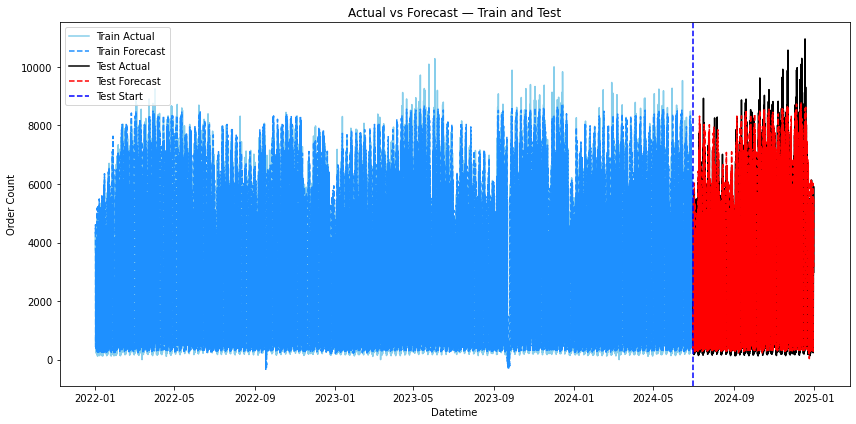

In [0]:
plt.figure(figsize=(12, 6))

# TRAIN section
plt.plot(df_train_pred["pickup_binned"], df_train_pred["order_count"], label="Train Actual", color="skyblue")
plt.plot(df_train_pred["pickup_binned"], df_train_pred["prediction"], label="Train Forecast", linestyle="--", color="dodgerblue")

# TEST section
plt.plot(df_test_pred["pickup_binned"], df_test_pred["order_count"], label="Test Actual", color="black")
plt.plot(df_test_pred["pickup_binned"], df_test_pred["prediction"], label="Test Forecast", linestyle="--", color="red")

# Vertical split line
plt.axvline(pd.Timestamp("2024-07-01"), color="blue", linestyle="--", label="Test Start")

plt.xlabel("Datetime")
plt.ylabel("Order Count")
plt.title("Actual vs Forecast — Train and Test")
plt.legend()
plt.tight_layout()
plt.show()

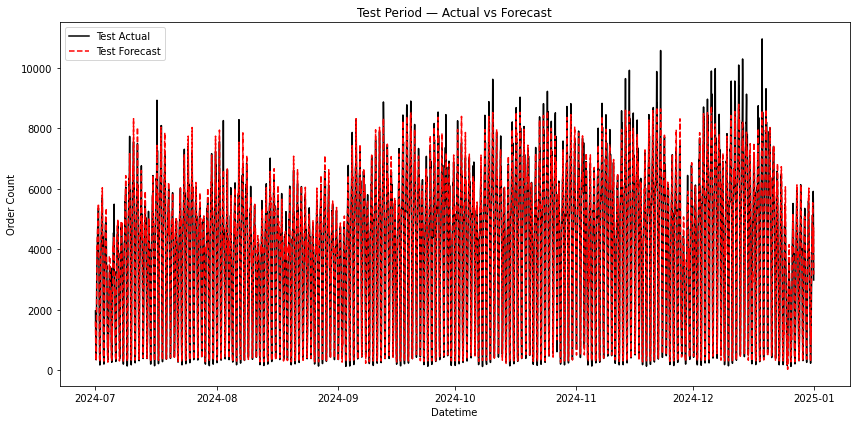

In [0]:
# 2) Plot actual vs predicted for TEST only
plt.figure(figsize=(12, 6))

plt.plot(df_test_pred["pickup_binned"], df_test_pred["order_count"], label="Test Actual", color="black")
plt.plot(df_test_pred["pickup_binned"], df_test_pred["prediction"], label="Test Forecast", linestyle="--", color="red")

plt.xlabel("Datetime")
plt.ylabel("Order Count")
plt.title("Test Period — Actual vs Forecast")
plt.legend()
plt.tight_layout()
plt.show()


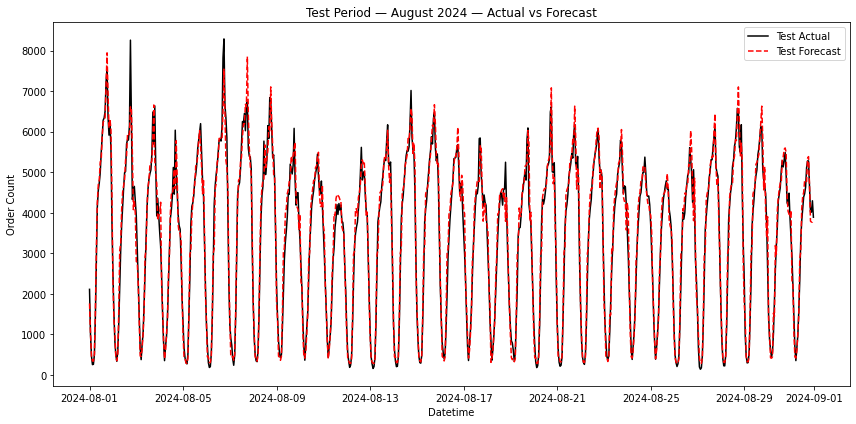

In [0]:
# Filter for August 2024 (month == 8)
df_test_august = df_test_pred[
    (df_test_pred["pickup_binned"].dt.month == 8) &
    (df_test_pred["pickup_binned"].dt.year == 2024)
].sort_values("pickup_binned")

# Plot for August 2024
plt.figure(figsize=(12, 6))
plt.plot(df_test_august["pickup_binned"], df_test_august["order_count"], label="Test Actual", color="black")
plt.plot(df_test_august["pickup_binned"], df_test_august["prediction"], label="Test Forecast", linestyle="--", color="red")

plt.xlabel("Datetime")
plt.ylabel("Order Count")
plt.title("Test Period — August 2024 — Actual vs Forecast")
plt.legend()
plt.tight_layout()
plt.show()

# 6. Traditional Forecasting

In [0]:
df_full_casted= spark.read.parquet("/dbfs/FileStore/tables/model/df_full_casted.parquet")

In [0]:
train = df_full_casted.filter(col("pickup_binned") < "2024-01-01").repartition(4)
val   = df_full_casted.filter((col("pickup_binned") >= "2024-01-01") & (col("pickup_binned") < "2024-07-01")).repartition(4)
test  = df_full_casted.filter(col("pickup_binned") >= "2024-07-01").repartition(4)

In [0]:
# Convert Spark test to pandas
train_pd = (
    train.select("pickup_binned", "order_count")
         .toPandas()
         .sort_values("pickup_binned")
)

train_pd["pickup_binned"] = pd.to_datetime(train_pd["pickup_binned"])

# --- Validation ---
val_pd = (
    val.select("pickup_binned", "order_count")
       .toPandas()
       .assign(pickup_binned=lambda df: pd.to_datetime(df["pickup_binned"]))
       .set_index("pickup_binned")
       .sort_index()  # <- garante ordenação temporal
)

# --- Test ---
test_pd = (
    test.select("pickup_binned", "order_count")
        .toPandas()
        .assign(pickup_binned=lambda df: pd.to_datetime(df["pickup_binned"]))
        .set_index("pickup_binned")
        .sort_index()  # <- garante ordenação temporal
)

## 6.1 Prophet

In [0]:
%pip install Prophet

Python interpreter will be restarted.
Python interpreter will be restarted.


In [0]:
from prophet import Prophet
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import numpy as np

In [0]:
# Prepare data for Prophet
df_prophet = train_pd.rename(columns={"pickup_binned": "ds", "order_count": "y"})
model = Prophet()
model.fit(df_prophet)

# Calculate forecast horizon up to 2024-12-31
last_train = df_prophet["ds"].max()
last_target = pd.to_datetime("2024-12-31 23:00:00")
horizon_hours = int((last_target - last_train).total_seconds() // 3600)

# Generate future dates and make forecast
future = model.make_future_dataframe(periods=horizon_hours, freq='H')
forecast = model.predict(future)

# Check the last forecasted date
print("📅 Forecast ends at:", forecast["ds"].max())


22:15:49 - cmdstanpy - INFO - Chain [1] start processing
22:15:54 - cmdstanpy - INFO - Chain [1] done processing


📅 Forecast ends at: 2024-12-31 23:00:00


In [0]:
# Prepare forecast with datetime index
forecast_indexed = forecast.set_index("ds")[["yhat", "yhat_lower", "yhat_upper"]]

# Join forecast with actual values from validation and test sets
eval_val = val_pd.join(forecast_indexed).dropna()
eval_test = test_pd.join(forecast_indexed).dropna()

# Compute error metrics
rmse_val = np.sqrt(mean_squared_error(eval_val["order_count"], eval_val["yhat"]))
mae_val = mean_absolute_error(eval_val["order_count"], eval_val["yhat"])
rmse_test = np.sqrt(mean_squared_error(eval_test["order_count"], eval_test["yhat"]))
mae_test = mean_absolute_error(eval_test["order_count"], eval_test["yhat"])

# Display results
print(f"📊 Validation RMSE: {rmse_val:.2f}, MAE: {mae_val:.2f}")
print(f"📊 Test RMSE: {rmse_test:.2f}, MAE: {mae_test:.2f}")


📊 Validation RMSE: 1153.73, MAE: 949.53
📊 Test RMSE: 1878.30, MAE: 1649.64


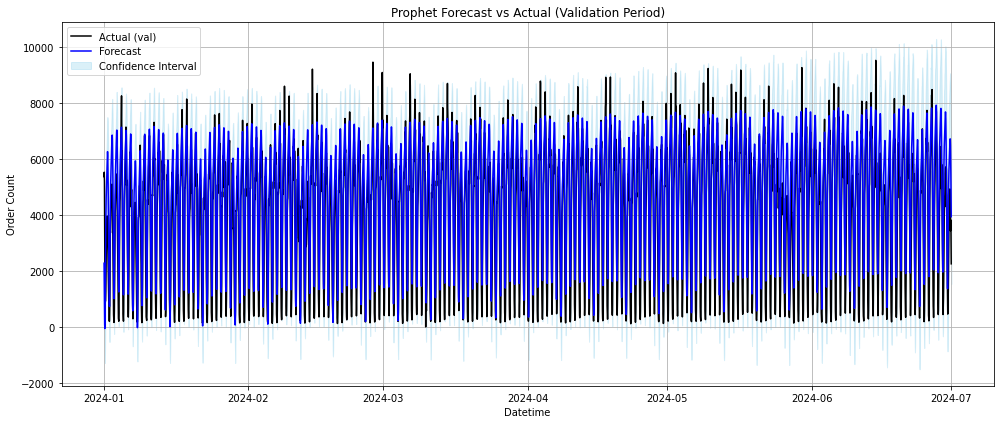

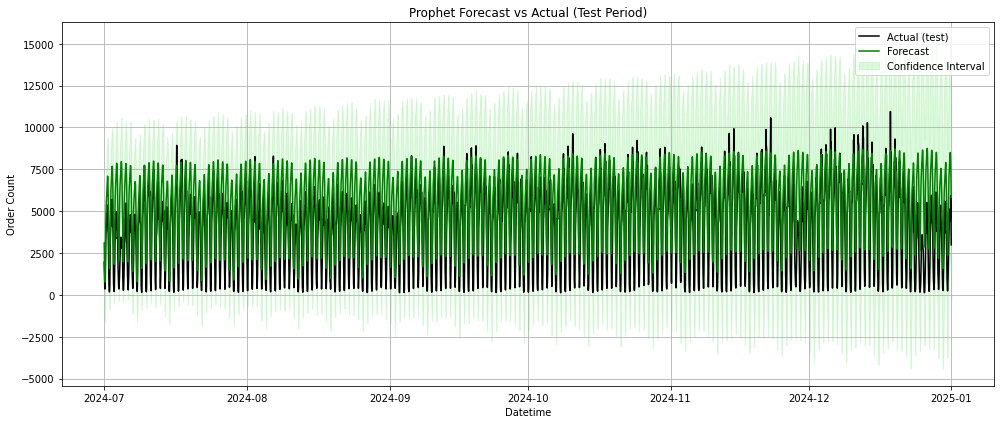

In [0]:
# --- VALIDATION ---
plt.figure(figsize=(14, 6))
plt.plot(eval_val.index, eval_val["order_count"], label="Actual (Validation)", color="black")
plt.plot(eval_val.index, eval_val["yhat"], label="Forecast", color="blue")
plt.fill_between(eval_val.index,
                 eval_val["yhat_lower"], eval_val["yhat_upper"],
                 color="skyblue", alpha=0.3, label="Confidence Interval")
plt.title("Prophet Forecast vs Actual - Validation Period")
plt.xlabel("Datetime")
plt.ylabel("Order Count")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# --- TEST ---
plt.figure(figsize=(14, 6))
plt.plot(eval_test.index, eval_test["order_count"], label="Actual (Test)", color="black")
plt.plot(eval_test.index, eval_test["yhat"], label="Forecast", color="green")
plt.fill_between(eval_test.index,
                 eval_test["yhat_lower"], eval_test["yhat_upper"],
                 color="lightgreen", alpha=0.3, label="Confidence Interval")
plt.title("Prophet Forecast vs Actual - Test Period")
plt.xlabel("Datetime")
p



## 6.2 ARIMA